In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget --header="Host: thor.robots.ox.ac.uk" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/89.0.4389.82 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,hi;q=0.6" --header="Referer: https://www.robots.ox.ac.uk/" --header="Cookie: _ga=GA1.3.447472098.1614888528; _gid=GA1.3.438299578.1615686909; _gat=1" --header="Connection: keep-alive" "https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip" -c -O 'SynthText.zip'

--2021-05-07 03:17:43--  https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40717671794 (38G) [application/zip]
Saving to: ‘SynthText.zip’

SynthText.zip       100%[===================>]  37.92G  20.7MB/s    in 31m 36s 

2021-05-07 03:49:20 (20.5 MB/s) - ‘SynthText.zip’ saved [40717671794/40717671794]



In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/89.0.4389.90 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,hi;q=0.6" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.567376463.1614948806; PHPSESSID=f2rmmqdv6bur83qvu12pg6bdip; _gid=GA1.2.297659251.1616264264" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_images.zip" -c -O 'ch4_training_images.zip'

--2021-05-07 04:29:23--  https://rrc.cvc.uab.es/downloads/ch4_training_images.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90667586 (86M) [application/zip]
Saving to: ‘ch4_training_images.zip’

ch4_training_images 100%[===================>]  86.47M  18.1MB/s    in 5.9s    

2021-05-07 04:29:30 (14.8 MB/s) - ‘ch4_training_images.zip’ saved [90667586/90667586]



In [ ]:
/content/SynthText.zip

In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/89.0.4389.90 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,hi;q=0.6" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.567376463.1614948806; PHPSESSID=f2rmmqdv6bur83qvu12pg6bdip; _gid=GA1.2.297659251.1616264264" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip" -c -O 'ch4_training_localization_transcription_gt.zip'

--2021-05-07 04:33:16--  https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344624 (337K) [application/zip]
Saving to: ‘ch4_training_localization_transcription_gt.zip’

ch4_training_locali 100%[===================>] 336.55K   525KB/s    in 0.6s    

2021-05-07 04:33:18 (525 KB/s) - ‘ch4_training_localization_transcription_gt.zip’ saved [344624/344624]



In [ ]:
#loading the icdar dataset
#os.mkdir("icdar1000")
#!unzip "ch4_training_images.zip" -d "icdar1000/"

#loading the ground truth of icdar dataset
#os.mkdir("icdar_gt")
#!unzip "ch4_training_localization_transcription_gt.zip" -d "icdar_gt/"

In [2]:
# Importing the libraries
import os
import re
import cv2
import scipy.io
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import matplotlib.patches as patches
from tqdm import tqdm

In [ ]:
!cp -r SynthText.zip /content/drive/MyDrive/

^C


In [ ]:
!rm -rf /content/drive/MyDrive/SynthText.zip

In [3]:
#Getting all directories of whole images in a list
def image_detail():
    width=[]
    height=[]
    size=[]
    files=[]
    for root,dirs,file in tqdm(os.walk('/content/SynthText',topdown=True)):
        for i in file:
            files.append(root+os.sep+i)
    return files 
    
total_images=image_detail()

0it [00:00, ?it/s]


In [4]:
len(total_images)

0

We are having total 858771 images in our SynthText data. As this data set is too large we will consider random sample data of this dataset for EDA

In [ ]:
#Source : https://thispointer.com/python-how-to-unzip-a-file-extract-single-multiple-or-all-files-from-a-zip-archive/
"""from zipfile import ZipFile
file_name = '/content/SynthText.zip'
destination_path = 'destination_path'
archive = ZipFile(file_name)

for file in archive.namelist():
    if file.startswith('SynthText/27/'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/gt.mat'):
        archive.extract(file, destination_path)

for file in archive.namelist():
    if file.startswith('SynthText/47/'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/57/'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/97/'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/127/'):
        archive.extract(file, destination_path)     

for file in archive.namelist():
    if file.startswith('SynthText/157/'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/187/*'):
        archive.extract(file, destination_path)
        
for file in archive.namelist():
    if file.startswith('SynthText/197/'):
        archive.extract(file, destination_path) """

In [ ]:
# As the data is is very large we will do doing EDA of some random sample data 

!unzip -qq SynthText.zip "SynthText/gt.mat" -d "."
!unzip -qq SynthText.zip "SynthText/27/*" -d "."
!unzip -qq SynthText.zip "SynthText/47/*" -d "."
!unzip -qq SynthText.zip "SynthText/57/*" -d "."
!unzip -qq SynthText.zip "SynthText/97/*" -d "."
!unzip -qq SynthText.zip "SynthText/127/*" -d "."
!unzip -qq SynthText.zip "SynthText/157/*" -d "."
!unzip -qq SynthText.zip "SynthText/187/*" -d "."
!unzip -qq SynthText.zip "SynthText/197/*" -d "."


In [5]:
!cp SynthText/gt.mat /content/drive/MyDrive/cs2/SynthText1/

cp: cannot stat 'SynthText/gt.mat': No such file or directory


In [ ]:
!cp -r SynthText/* /content/drive/MyDrive/cs2/SynthText/

In [ ]:
!rm -rf SynthText

In [6]:
#Getting all directories of sample images in a list
def image_detail():
    width=[]
    height=[]
    size=[]
    files=[]
    for root,dirs,file in os.walk('drive/MyDrive/cs2/SynthText/',topdown=True):
        #print(file)
        for i in file:
            #files.append(root+os.sep+i)
            files.append(root+'/'+i)
    return files 
    
images=image_detail()

In [7]:
len(images)

34356

We are having 34356 images on which we will perform EDA for images

# EDA on images

In [8]:
#Plotiing the 2 X 2 images grid
def show_images(images):
    f, ax = plt.subplots(2, 2, figsize=(15, 15))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(images[idx], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10,10))
        ax[idx].imshow(image)

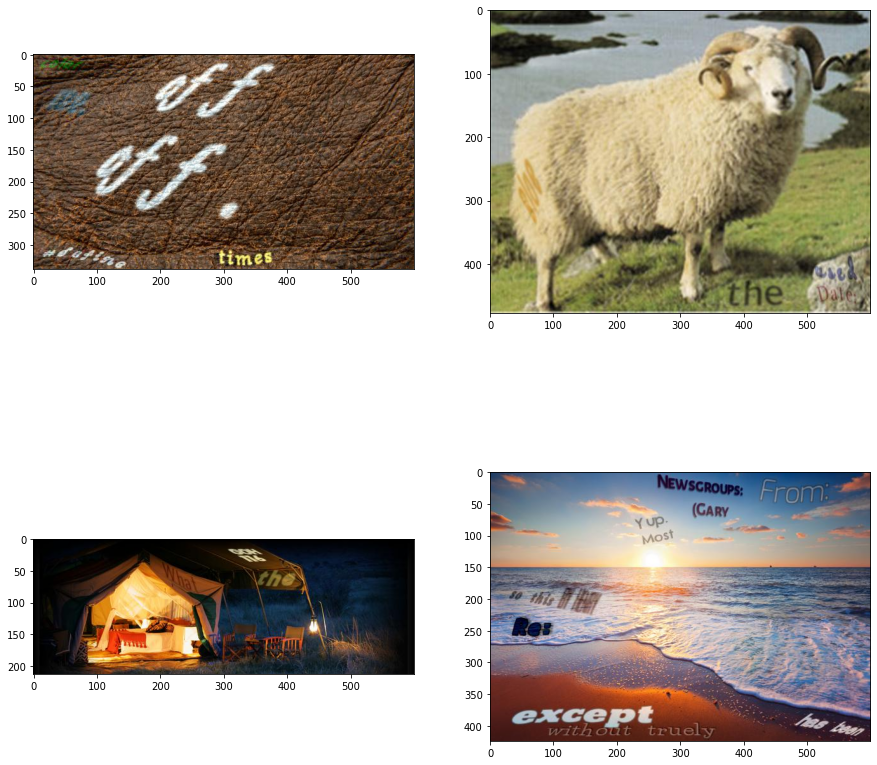

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [9]:
#plotting some random images
import random
random_images = random.sample(images,16)
show_images(random_images[:4])



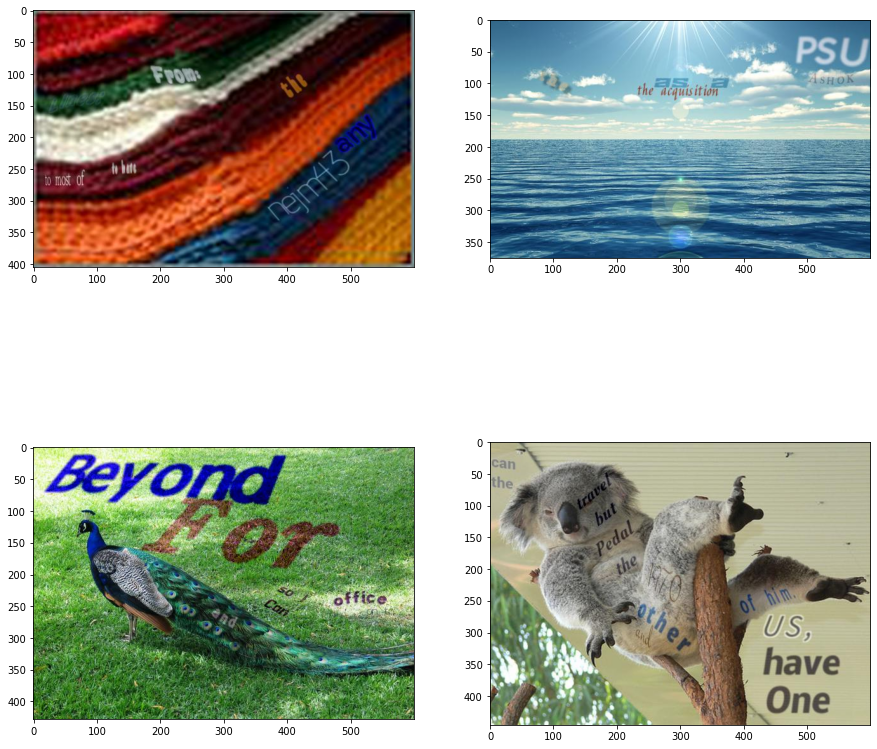

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [10]:
show_images(random_images[4:8])


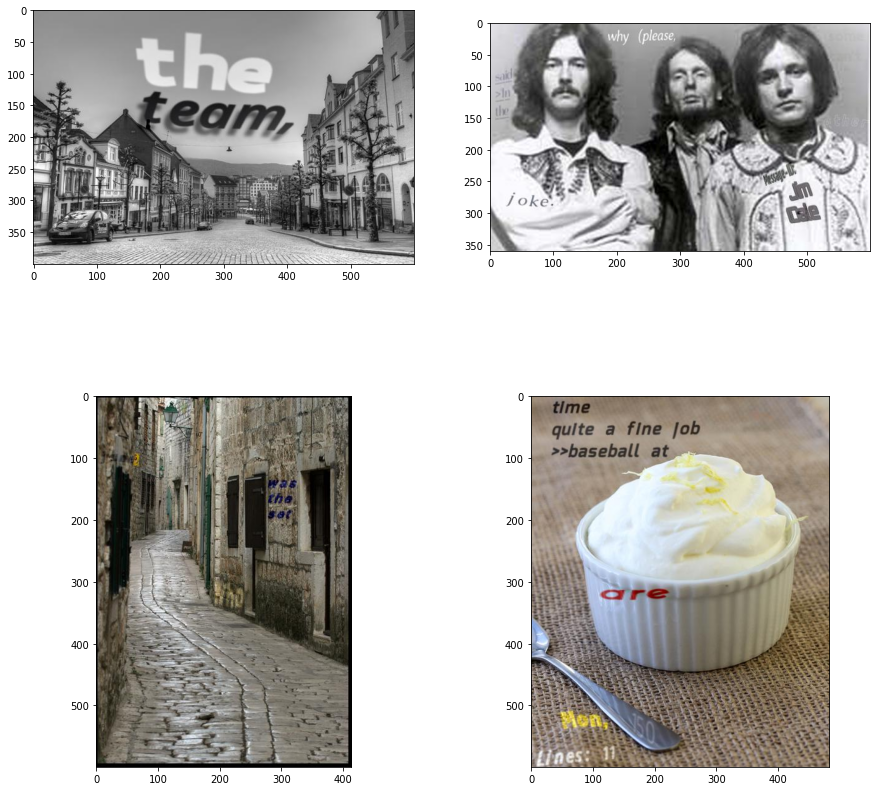

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [11]:
show_images(random_images[8:12])

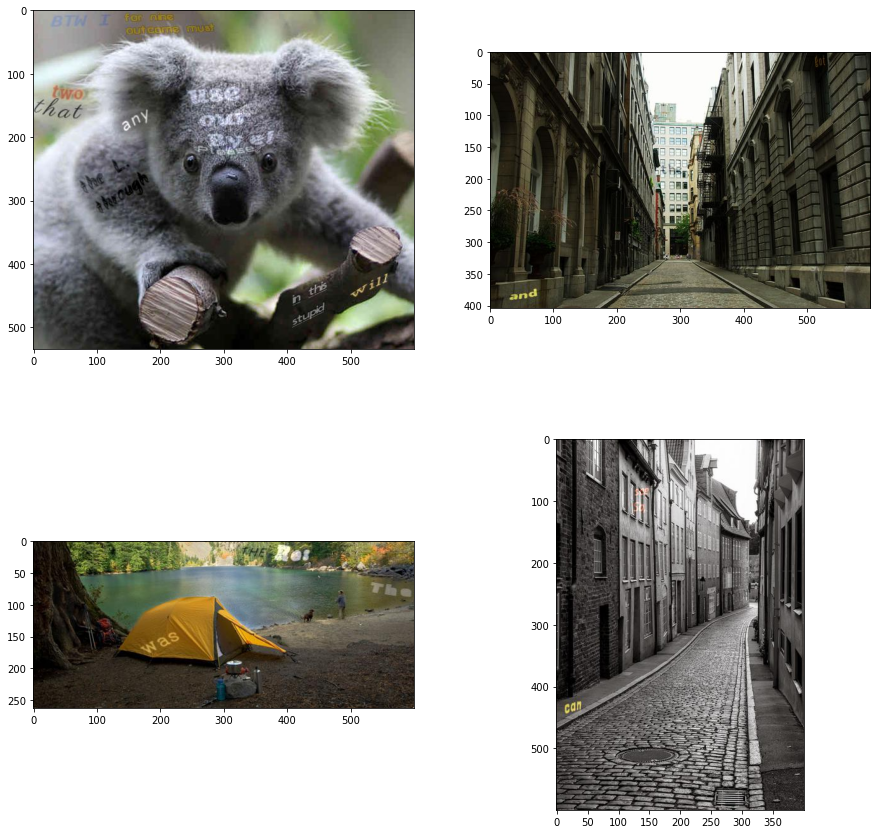

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [12]:
show_images(random_images[-4:])

In [25]:
print(len(images))

34356


In [26]:
#Getting width , height and size in bytes of images
from tqdm import tqdm
width=[]
height=[]
size=[]
for img in tqdm(images):
    image = cv2.imread(img,cv2.COLOR_BGR2RGB)
    #print(img)
    size.append(int(os.path.getsize(img)/1024))
    w, h,_=image.shape
    width.append(w)
    height.append(h)
    




  0%|          | 0/34356 [00:00<?, ?it/s]


  0%|          | 17/34356 [00:00<03:27, 165.28it/s]


  0%|          | 32/34356 [00:00<03:38, 157.41it/s]


  0%|          | 48/34356 [00:00<03:38, 157.10it/s]


  0%|          | 63/34356 [00:00<03:44, 152.81it/s]


  0%|          | 80/34356 [00:00<03:40, 155.43it/s]


  0%|          | 96/34356 [00:00<03:41, 154.36it/s]


  0%|          | 113/34356 [00:00<03:37, 157.47it/s]


  0%|          | 128/34356 [00:00<03:43, 152.82it/s]


  0%|          | 144/34356 [00:00<03:44, 152.20it/s]


  0%|          | 159/34356 [00:01<03:53, 146.72it/s]


  1%|          | 175/34356 [00:01<03:48, 149.53it/s]


  1%|          | 190/34356 [00:01<03:52, 147.06it/s]


  1%|          | 207/34356 [00:01<03:43, 153.10it/s]


  1%|          | 224/34356 [00:01<03:38, 156.20it/s]


  1%|          | 240/34356 [00:01<03:37, 156.93it/s]


  1%|          | 256/34356 [00:01<03:39, 155.56it/s]


  1%|          | 272/34356 [00:01<03:38, 156.08it/s]


  1%|          | 288/343

KeyboardInterrupt: ignored

In [ ]:
#Converting image data to csv file
list1=[width,height,size]
img_data = pd.DataFrame(list1, index=['width', 'height','size']).T
img_data.to_csv('img_data.csv')

In [ ]:
img_data.shape

In [ ]:
img_data['width'].describe()

In [ ]:
#Probability Density Function for image width
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(img_data['width'].values)
plt.title("Histogram of width")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the images are having width between 300 and 500.
2. There are few images who are having width of 600.
3. There very few images whose width is less than 300.

In [ ]:
#Probability Density Function for image height
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(img_data['height'].values)
plt.title("Histogram of height")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the images are having height of 600 
2. There are few images who are having height of 400 and 450.

In [ ]:
#Probability Density Function for image size
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(img_data['size'].values)
plt.title("Histogram of size")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the images are having size  between 20 and 80.
2. The average size of all images is 40 bytes
3. There very few images whose size is greater than 80.

# Visualizing the bounding boxex on images

In [ ]:
#extracting the ground truth values for image
# https://www.robots.ox.ac.uk/~vgg/data/scenetext/readme.txt
ground_truth = scipy.io.loadmat(f'destination_path/gt.mat')
ground_truth.keys()

dict_keys(['__header__', '__version__', '__globals__', 'charBB', 'wordBB', 'imnames', 'txt'])

In [ ]:
imname = ground_truth['imnames'][0]
wordBB = ground_truth['wordBB'][0]
txt = ground_truth['txt'][0]

In [ ]:
#list_of_tuples = list(zip(imname,wordBB,txt))
list2= [imname,wordBB,txt]

In [ ]:
#data = pd.DataFrame(list(zip(imname,wordBB,txt)),columns=["imname",'wordBB','txt'])
data = pd.DataFrame(list2,index=["imname",'wordBB','txt']).T
data.head()

,imname,wordBB,txt
0,[8/ballet_106_0.jpg],"[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,[8/ballet_106_1.jpg],"[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,[8/ballet_106_10.jpg],"[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,[8/ballet_106_100.jpg],"[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,[8/ballet_106_101.jpg],"[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


In [ ]:
data.shape

(858750, 3)

In [ ]:
data['wordBB'][0].shape

(2, 4, 15)

wordBB  is the   word-level bounding-boxes for each image, represented by tensors of size 2x4xNWORDS_i, where:
 1. The first dimension is 2 for x and y respectively,
 2. The second dimension corresponds to the 4 points of rectangele vertices (clockwise, starting from top-left)
 3. The third dimension of size NWORDS_i, corresponds to the number of words in the i_th image

In [ ]:
# Function for generating bounding boxes on the image of text
def show_bboxes(images, bbox, color='red'):

    _,ax = plt.subplots(2,2,figsize=(15, 15))
    ax = ax.flatten()

    for i in range(4):
        image = cv2.imread(images[i], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        for j in range(bbox[i].shape[-1]):
            
            vertices = [
                (bbox[i][0][0][j], bbox[i][1][0][j]),
                (bbox[i][0][1][j], bbox[i][1][1][j]),
                (bbox[i][0][2][j], bbox[i][1][2][j]),
                (bbox[i][0][3][j], bbox[i][1][3][j])]

            bboxes = patches.Polygon(
                vertices,
                linewidth=2,
                edgecolor=color,
                facecolor='none',
            )
            ax[i].add_patch(bboxes)

        ax[i].imshow(image)

In [ ]:
#Preparing the data for generating sample images with bounding boxes
img_name=[i.split('SynthText/')[1] for i in random_images]    
val=data[data['imname']==img_name[0]]
for i in img_name[1:]:
    val1=data[data['imname']==i]
    val=pd.concat([val,val1])

In [ ]:
val.head(10)

,imname,wordBB,txt
631497,[197/wozniak_57_71.jpg],"[[[160.64307, 148.3524, 141.33029, 159.12573, ...","[The , both\nmuch , #if , In..."
543623,[127/person_118_43.jpg],"[[[214.31998, 201.39897, 205.11046, 217.03569,...","[The , I can help , Ken ..."
46370,[187/village_4_87.jpg],"[[[144.94162, 272.82803, 329.70605, 276.47495,...","[Nippon , going to\nout how the, ..."
607424,[97/koala_99_78.jpg],"[[[316.9344, 290.78787], [362.90405, 358.88278...","[the , jama]"
46872,[187/village_47_46.jpg],"[[[538.52814, 354.1362, 422.14005, 526.2803, 5...","[they , Lines: 14, the , want ]"
44881,[187/village_15_26.jpg],"[[[80.99342, 119.53014, 211.91682, 86.569626, ...","[not addressed to\nLebanese from a, the ..."
775274,[47/cream_65_20.jpg],"[[[5.220768, 68.56385, 298.6329, 132.08675, 15...","[by check , Date: , the..."
630940,[197/wozniak_40_63.jpg],"[[[304.59167, 282.27655, 294.00436, 300.03055,...","[she , has , many\nare ,..."
390473,[27/camping_111_66.jpg],"[[[443.01904, 263.381, 468.08517, 361.27643, 5...","[you , heard , The , >In , and , can ..."
15667,[157/sea_9_53.jpg],"[[[520.8385, 507.13678, 281.96014, 284.7256, 3...","[ --Bill \nNewsgroups: , n..."


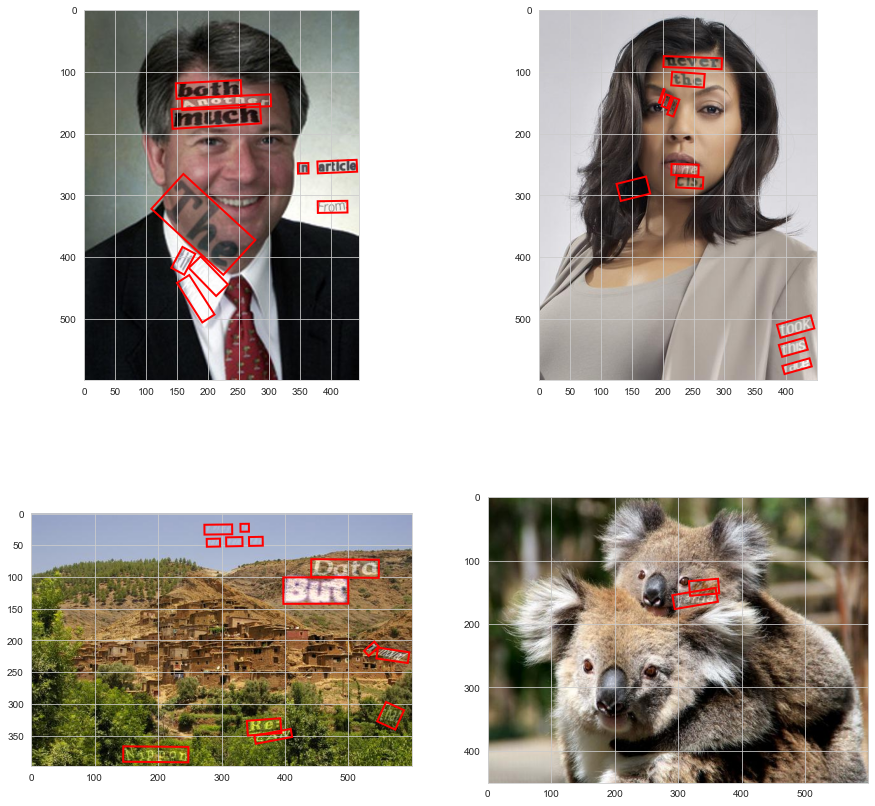

In [ ]:
show_bboxes(random_images[:4],val['wordBB'][:4].values)

In [ ]:
#show_bboxes(random_images[8:12],val['wordBB'][8:12].values)

In [ ]:
#show_bboxes(random_images[-4:],val['wordBB'][-4:].values)

# EDA on bounding boxes

In [ ]:
bbox=[x[0].shape[-1] for x in data['wordBB']]

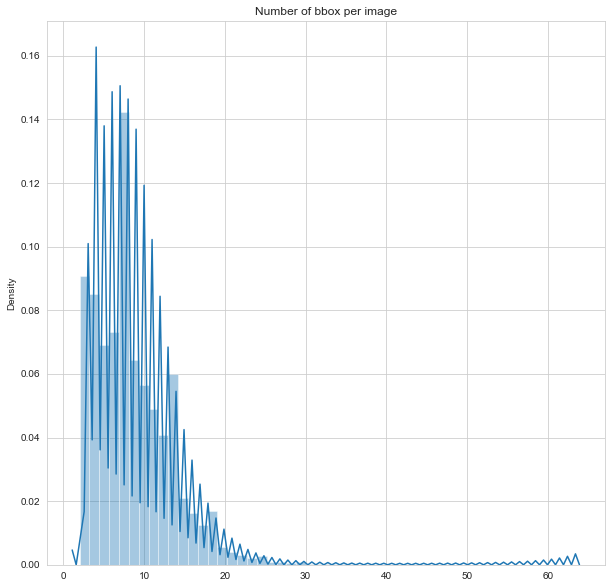

In [ ]:
#bbox distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox)
plt.title("Number of bbox per image")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the images are having number of bounding boxes less than 15.
2. There are few images who are greater than 15 bounding boxes per image.
3. The average number of bounding boxes per image are aprox. 9.

In [ ]:
# Calculating the width,height and size of bounding boxes
def distance_between_points(p1, p2):
    p1, p2 = np.array(p1), np.array(p2)
    return np.sqrt(np.sum((p1-p2)**2))

bbox_w=[] 
bbox_h=[] 
bbox_size=[]

for i in tqdm(range(len(data['wordBB'].iloc[:40000]))):
    for bbox_i in range(data['wordBB'][i].shape[-1]):
        if len(data['wordBB'][i].shape) == 2:
            top_left = (data['wordBB'][i][0][0], data['wordBB'][i][1][0])
            top_right = (data['wordBB'][i][0][1], data['wordBB'][i][1][1])
            bottom_left = (data['wordBB'][i][0][3], data['wordBB'][i][1][3])
        else:
            top_left = (data['wordBB'][i][0][0][bbox_i], data['wordBB'][i][1][0][bbox_i])
            top_right = (data['wordBB'][i][0][1][bbox_i], data['wordBB'][i][1][1][bbox_i])
            bottom_left = (data['wordBB'][i][0][3][bbox_i], data['wordBB'][i][1][3][bbox_i])

        w = distance_between_points(top_left, top_right)
        h = distance_between_points(top_left, bottom_left)
        
        bbox_w.append(w)
        bbox_h.append(h)
        bbox_size.append(w*h)

100%|███████████████████████████████████████████████████████████████████████████| 40000/40000 [00:56<00:00, 713.73it/s]


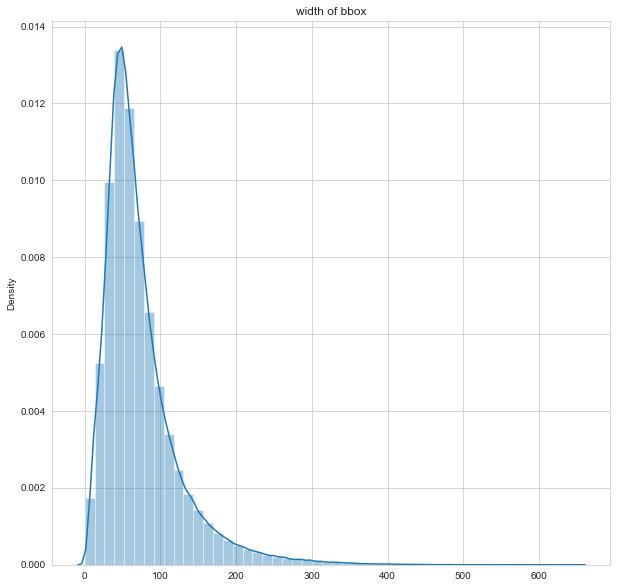

In [ ]:
#bbox width distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_w)
plt.title("width of bbox")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the bounding boxes are having width between 20 and 200.
2. There are few images with bounding boxes whose  width is greater than 200.
3. Average width of bounding boxes is aprrox. 80

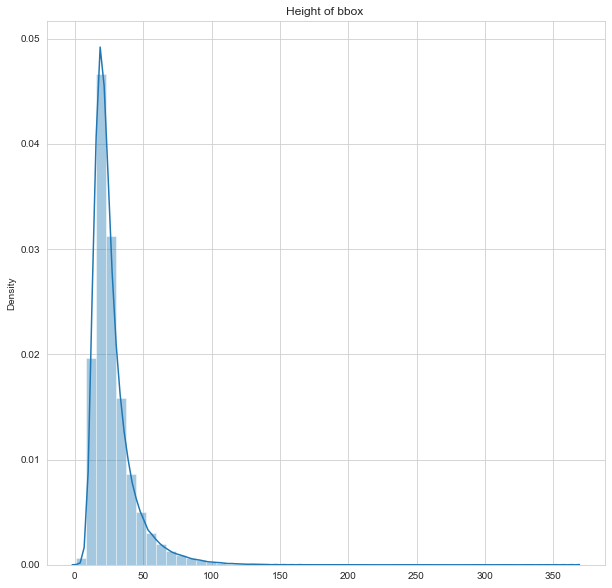

In [ ]:
#bbox height distibution 
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_h)
plt.title("Height of bbox ")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the bounding boxes are having heigth between 20 and 50.
2. There are few  bounding boxes whose height is greater than 50.
3. Average width of bounding boxes is aprrox. 30

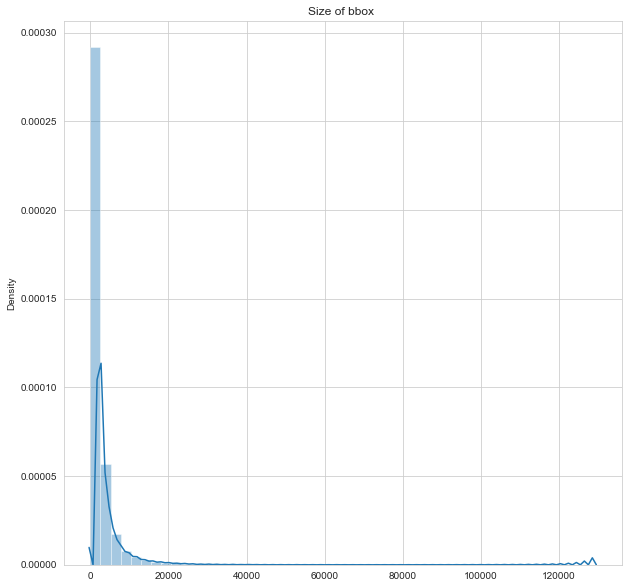

In [ ]:
#bbox size distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_size)
plt.title("Size of bbox ")
plt.ylabel("Density")
plt.show()

As from above we can observe,
1. Most of the bounding boxes are having  area less than 20000.
2. There are few  bounding boxes whose area is greater than 20000.
3. Average area of bounding boxes is aprrox. 5000

# EDA on ICDAR 15 dataset

In [ ]:
#Getting all directories of whole images of icdar 15 dataset in a list
def image_detail(icdar1000):
    files=[]
    for root,dirs,file in tqdm(os.walk(icdar1000,topdown=True)):
        for i in file:
            files.append(root+'/'+i)
    return files 

icdar1000 = 'data/ch4_training_images'   
total_images=image_detail(icdar1000)
print(len(total_images))

1it [00:00, 22.30it/s]

1000


In [ ]:
total_images

['data/ch4_training_images/img_1.jpg',
 'data/ch4_training_images/img_10.jpg',
 'data/ch4_training_images/img_100.jpg',
 'data/ch4_training_images/img_1000.jpg',
 'data/ch4_training_images/img_101.jpg',
 'data/ch4_training_images/img_102.jpg',
 'data/ch4_training_images/img_103.jpg',
 'data/ch4_training_images/img_104.jpg',
 'data/ch4_training_images/img_105.jpg',
 'data/ch4_training_images/img_106.jpg',
 'data/ch4_training_images/img_107.jpg',
 'data/ch4_training_images/img_108.jpg',
 'data/ch4_training_images/img_109.jpg',
 'data/ch4_training_images/img_11.jpg',
 'data/ch4_training_images/img_110.jpg',
 'data/ch4_training_images/img_111.jpg',
 'data/ch4_training_images/img_112.jpg',
 'data/ch4_training_images/img_113.jpg',
 'data/ch4_training_images/img_114.jpg',
 'data/ch4_training_images/img_115.jpg',
 'data/ch4_training_images/img_116.jpg',
 'data/ch4_training_images/img_117.jpg',
 'data/ch4_training_images/img_118.jpg',
 'data/ch4_training_images/img_119.jpg',
 'data/ch4_training

In [ ]:
#Getting path of whole ground_truth of icdar 15 dataset in a list
def image_detail(icdar_gt):
    files=[]
    for root,dirs,file in tqdm(os.walk(icdar_gt,topdown=True)):
        for i in file:
            files.append(root+'/'+i)
    return files 

icdar_gt = 'data/ch4_training_localization_transcription_gt'
total_gt=image_detail(icdar_gt)
print(len(total_gt))

1it [00:00,  7.94it/s]

1000


In [ ]:
val=[sorted(total_images),sorted(total_gt)]
icdar15 = pd.DataFrame(val, index=['imname', 'ground_truth']).T
icdar15.head()

,imname,ground_truth
0,data/ch4_training_images/img_1.jpg,data/ch4_training_localization_transcription_g...
1,data/ch4_training_images/img_10.jpg,data/ch4_training_localization_transcription_g...
2,data/ch4_training_images/img_100.jpg,data/ch4_training_localization_transcription_g...
3,data/ch4_training_images/img_1000.jpg,data/ch4_training_localization_transcription_g...
4,data/ch4_training_images/img_101.jpg,data/ch4_training_localization_transcription_g...


In [ ]:
#Plotiing the 2 X 2 images grid
def show_images(images):
    f, ax = plt.subplots(2, 2, figsize=(20, 15))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(images[idx], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10,10))
        ax[idx].imshow(image)

# Visualizing icdar15 images

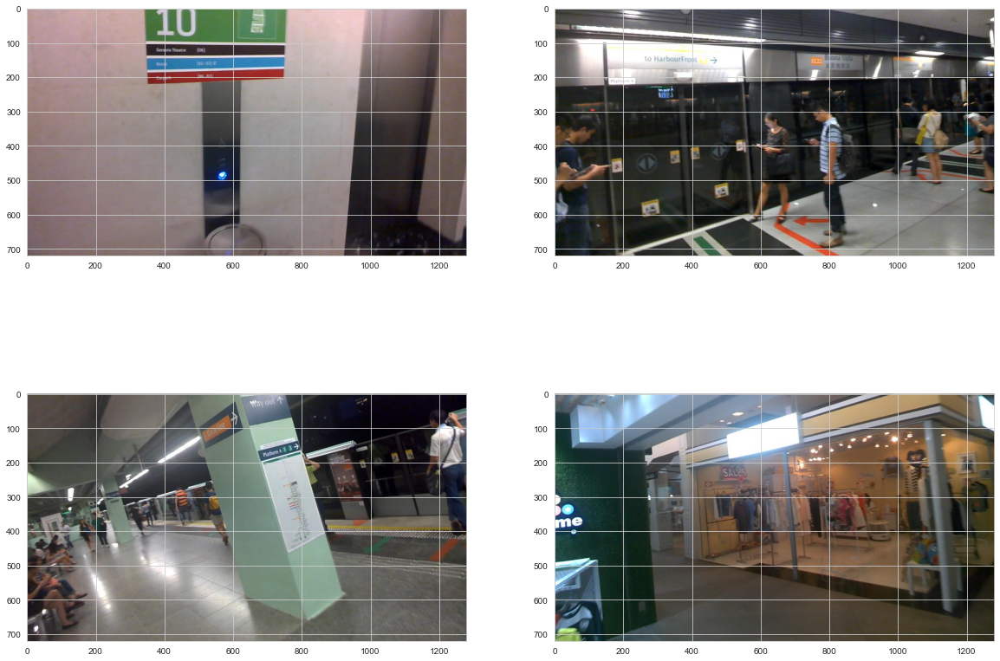

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [ ]:
#plotting some  images
img_list=icdar15['imname'].values
show_images(img_list[:4])

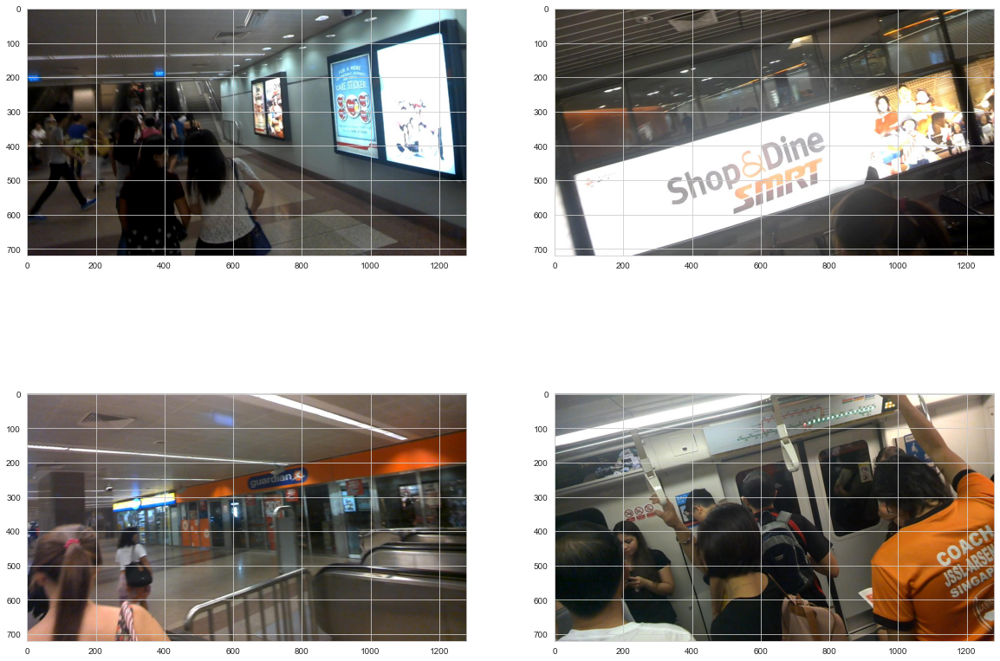

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [ ]:
#plotting some random images
show_images(img_list[4:8])

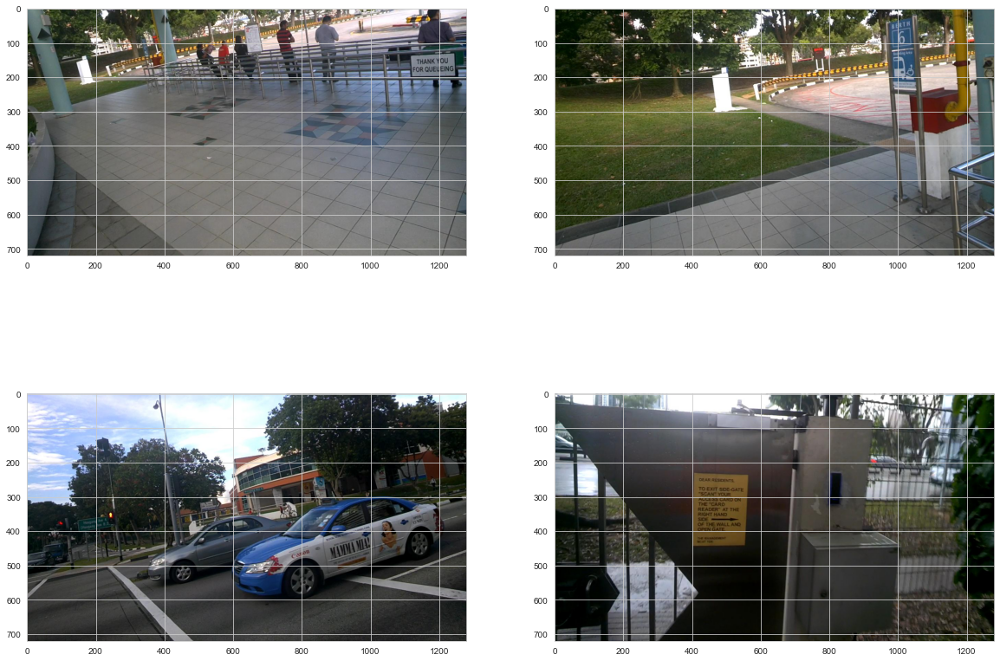

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [ ]:
show_images(img_list[8:12])


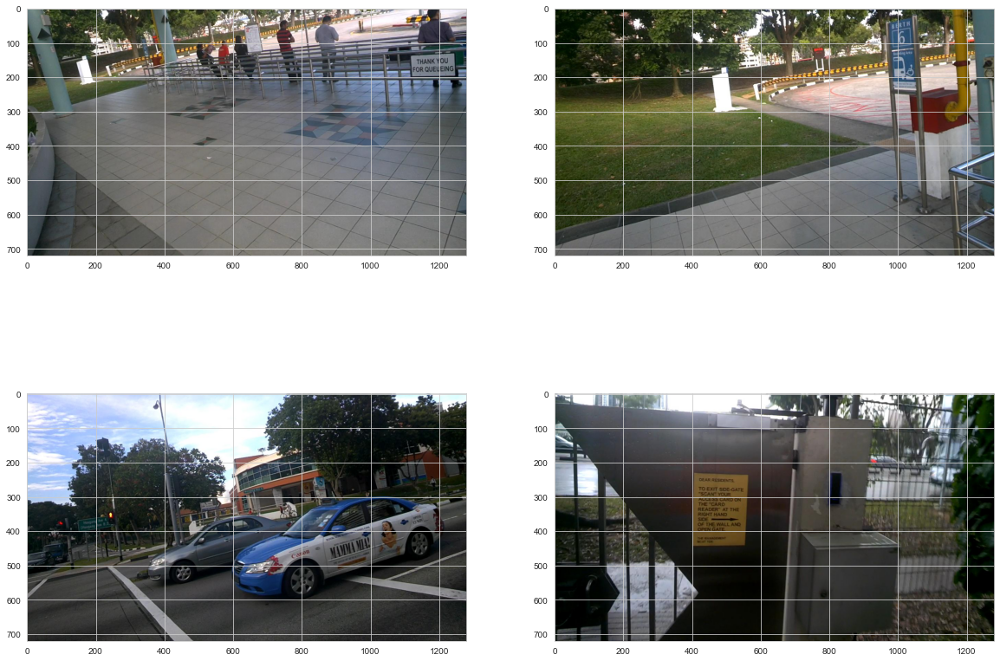

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

In [ ]:
show_images(img_list[8:12])


In [ ]:
#Getting width , height and size in bytes of images
from tqdm import tqdm
width=[]
height=[]
size=[]
for img in tqdm(total_images):
    image = cv2.imread(img,cv2.COLOR_BGR2RGB)
    size.append(int(os.path.getsize(img)/1024))
    w, h,_=image.shape
    width.append(w)
    height.append(h)
    

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:14<00:00, 69.58it/s]


In [ ]:
#Converting image data to csv file
list1=[width,height,size]
icdar_data = pd.DataFrame(list1, index=['width', 'height','size']).T

In [ ]:
icdar_data.shape

(1000, 3)

In [ ]:
icdar_data.describe()

,width,height,size
count,1000.0,1000.0,1000.000000
mean,720.0,1280.0,88.427000
std,0.0,0.0,19.843246
min,720.0,1280.0,22.000000
25%,720.0,1280.0,76.750000
50%,720.0,1280.0,86.000000
75%,720.0,1280.0,100.000000
max,720.0,1280.0,187.000000


In this icdar dataset all images are having width as 720 and height as 1280.Also these are the real world images which are having some blury background and not much clear as compared to synthText data set.

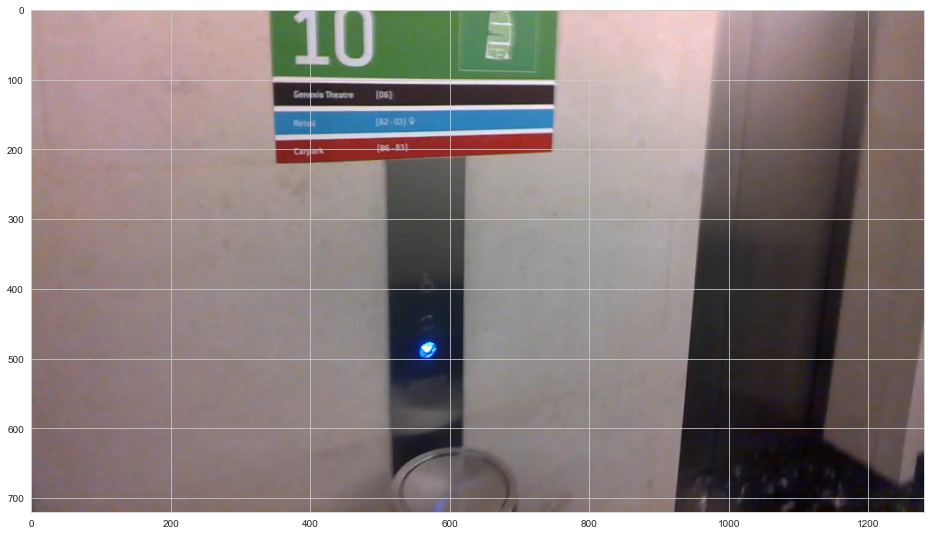

In [ ]:
# Plot a single image
from matplotlib import pyplot as plt
plt.figure(figsize=(16, 16))
image = cv2.imread('data/ch4_training_images/img_1.jpg', cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

From this, the first thing we notice is that the images are large but pretty blur and the texts are smaller as compared to the background

ref - https://rrc.cvc.uab.es/?ch=4&com=tasks

Here is the format of the ground truth labels x1, y1, x2, y2, x3, y3, x4, y4, transcription

It contains the (x, y) coordinates of rectangle in clockwise manner starting from top left corner followed by corresponding text transcription (actual word in text).

The text transcription also contains "###", which means "Don't care" word. For now, we will ignore such words

In [ ]:
print(type(icdar15))
print(type(icdar15['ground_truth']))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


In [ ]:
items = [1, 2, 3, 4, 5]
squared = list(map(lambda x: x**2, items))

In [ ]:
ssss

NameError: name 'ssss' is not defined

In [ ]:
# Adding ground truths to dataframe
def extract_gt(gt_path):
    """Extract ground truth coordinates from given text file."""
    # Reference: https://stackoverflow.com/a/49150749/5353128
    with open(gt_path, 'r', encoding='utf-8-sig') as f:
        content = f.read().split('\n')
        # Removing empty lines
        content = [line for line in content if line]
        return np.array(list(map(lambda str: str.split(',')[:-1], content)), dtype='object')

def extract_txt(gt_path):
    """Extract ground truth text/transcript from given text file."""
    with open(gt_path, 'r', encoding='utf-8-sig') as f:
        content = f.read().split('\n')
        # Removing empty lines
        content = [line for line in content if line]
        return np.array(list(map(lambda str: str.split(',')[-1], content)), dtype='object')



In [ ]:
# Extract ground truth bounding boxes
icdar15['ground_bboxes'] = icdar15['ground_truth'].map(extract_gt)

# Extract text for each ground truth
icdar15['ground_txt'] = icdar15['ground_truth'].map(extract_txt)
icdar15.head()

,imname,ground_truth,ground_bboxes,ground_txt
0,data/ch4_training_images/img_1.jpg,data/ch4_training_localization_transcription_g...,"[[377, 117, 463, 117, 465, 130, 378, 130], [49...","[Genaxis Theatre, [06], ###, 62-03, Carpark, #..."
1,data/ch4_training_images/img_10.jpg,data/ch4_training_localization_transcription_g...,"[[261, 138, 284, 140, 279, 158, 260, 158], [28...","[###, HarbourFront, CC22, bua, ###, ###, ###, ..."
2,data/ch4_training_images/img_100.jpg,data/ch4_training_localization_transcription_g...,"[[645, 19, 686, 13, 692, 43, 651, 48], [689, 1...","[Way, out, ###, Line, Platform, ###, ###, ###]"
3,data/ch4_training_images/img_1000.jpg,data/ch4_training_localization_transcription_g...,"[[486, 216, 554, 211, 558, 243, 489, 248], [1,...","[###, ###, ###, ###]"
4,data/ch4_training_images/img_101.jpg,data/ch4_training_localization_transcription_g...,"[[899, 214, 928, 213, 928, 241, 900, 242], [93...","[CARE, STICKER, FOR, ###, MORE, ###, ###, ###,..."


# Visualizig images with bounding boxes

In [ ]:
def plot_bb_icdar(images, bboxes ,titles , color='red'):
    """
    Plots bounding boxes over given image.
    """
    f, ax = plt.subplots(2, 2, figsize=(16, 10))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(images[idx], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Reference: https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.patches.Polygon.html
        for bbox_idx in range(bboxes[idx].shape[0]):
            # Define rectangle vertices
            vertices = [
                (bboxes[idx][bbox_idx][0], bboxes[idx][bbox_idx][1]),
                (bboxes[idx][bbox_idx][2], bboxes[idx][bbox_idx][3]),
                (bboxes[idx][bbox_idx][4], bboxes[idx][bbox_idx][5]),
                (bboxes[idx][bbox_idx][6], bboxes[idx][bbox_idx][7]),
            ]
            if list(map(str.strip, titles[idx]))[bbox_idx] != '###':
                # Draw the affine rectangle (polygon)
                bbox = patches.Polygon(
                    vertices,
                    linewidth=2,
                    edgecolor=color,
                    facecolor='none',
                )
                ax[idx].add_patch(bbox)
        ax[idx].title.set_text(", ".join([t for t in list(map(str.strip, titles[idx])) if t!='###']))
        ax[idx].imshow(image)

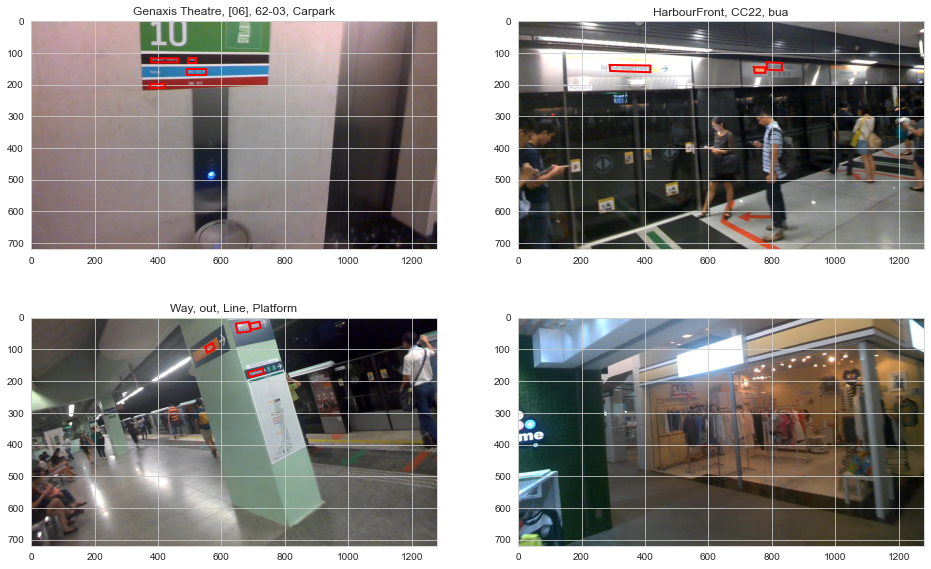

In [ ]:
imname=icdar15['imname'].values
gt_bb=icdar15['ground_bboxes'].values
titles=icdar15['ground_txt'].values
plot_bb_icdar(imname[:4],gt_bb[:4],titles[:4])

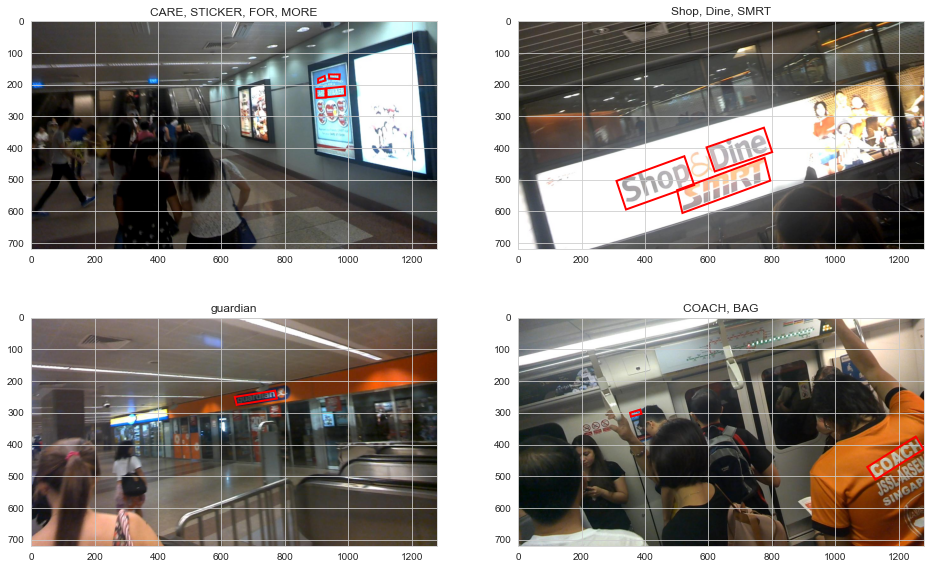

In [ ]:
plot_bb_icdar(imname[4:8],gt_bb[4:8],titles[4:8])

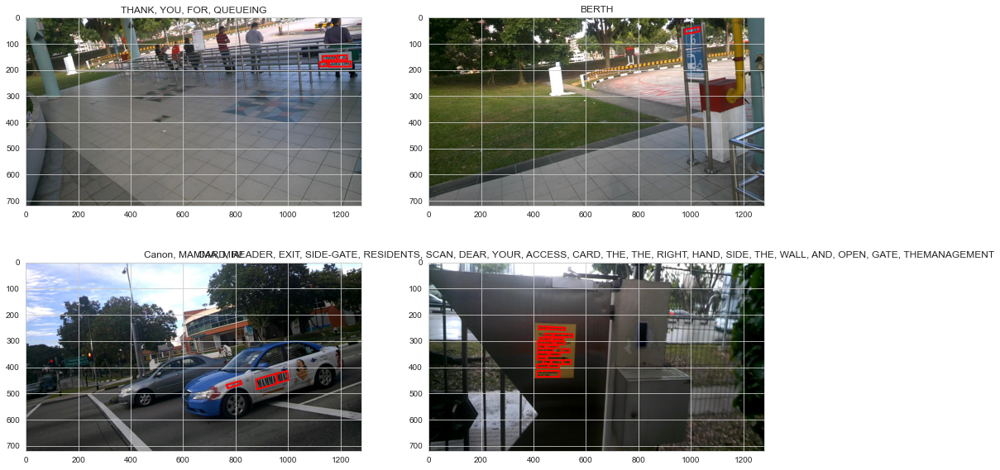

In [ ]:
plot_bb_icdar(imname[8:12],gt_bb[8:12],titles[8:12])

In [ ]:
bbox=[x.shape[0] for x in icdar15['ground_bboxes']]

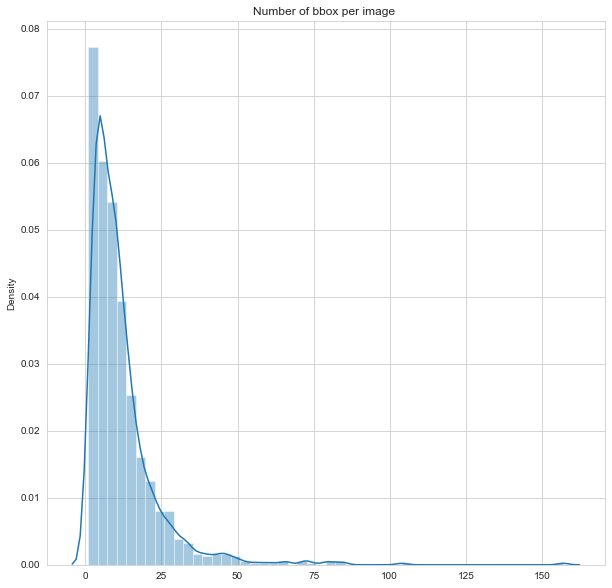

In [ ]:
#bbox distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox)
plt.title("Number of bbox per image ")
plt.ylabel("Density")
plt.show()

1. Most to the bounding box  per image are between 1 to 25.
2. Few are having number of bounding boxes per image more than 50.
3. Average number of bounding boxes per image is aprrox. 8.

In [ ]:
def distance_between_points(p1, p2):
    p1, p2 = np.array(p1), np.array(p2)
    return np.sqrt(np.sum((p1-p2)**2))

In [ ]:
bbox_w, bbox_h, bbox_size = [], [], []

for idx in tqdm(range(len(icdar15['ground_bboxes']))):
    for bbox_idx in range(icdar15['ground_bboxes'][idx].shape[0]):
        top_left = (icdar15['ground_bboxes'][idx][bbox_idx][0], icdar15['ground_bboxes'][idx][bbox_idx][1])
        top_right = (icdar15['ground_bboxes'][idx][bbox_idx][2], icdar15['ground_bboxes'][idx][bbox_idx][3])
        bottom_left = (icdar15['ground_bboxes'][idx][bbox_idx][6], icdar15['ground_bboxes'][idx][bbox_idx][7])

        top_left = tuple(map(int, top_left))
        top_right = tuple(map(int, top_right))
        bottom_left = tuple(map(int, bottom_left))

        w = distance_between_points(top_left, top_right)
        h = distance_between_points(top_left, bottom_left)
        
        bbox_w.append(w)
        bbox_h.append(h)
        bbox_size.append(w*h)

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 575.15it/s]


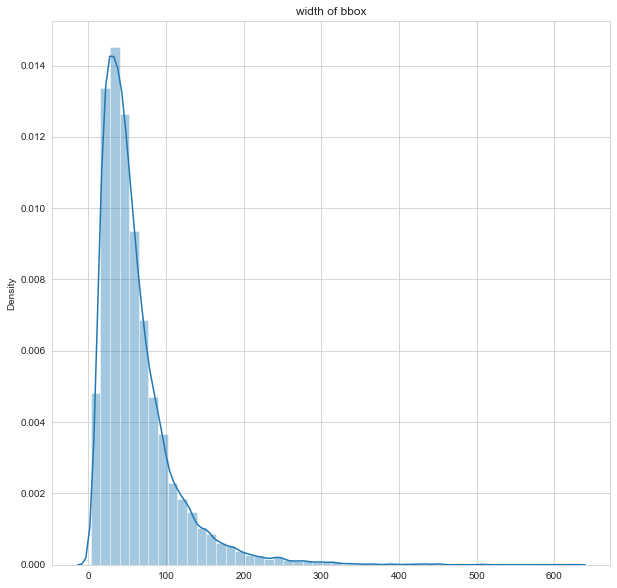

In [ ]:
#bbox width distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_w)
plt.title("width of bbox")
plt.ylabel("Density")
plt.show()

1. Most to the bounding box are having width betweeen 10 to 100.
2. few are having width more than 100.
3. Average width of all images is approx. 60

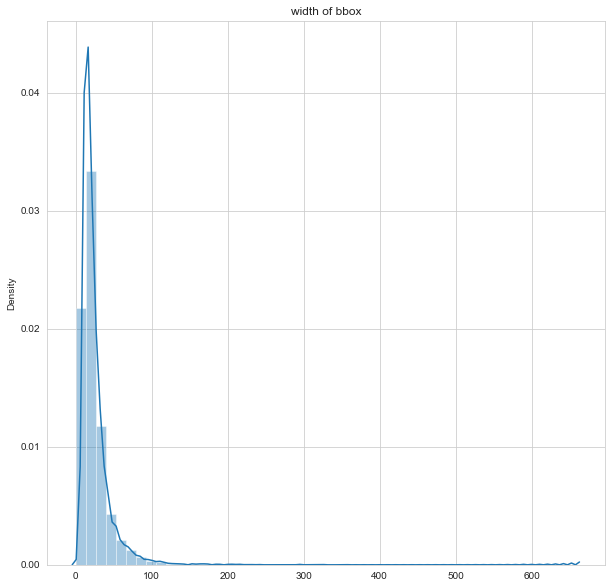

In [ ]:
#bbox width distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_h)
plt.title("width of bbox")
plt.ylabel("Density")
plt.show()

1. Most to the bounding box  are having height betweeen 10 to 60.
2. few are having width more than 60.
3. Average width of all bounding boxes is approx. 40

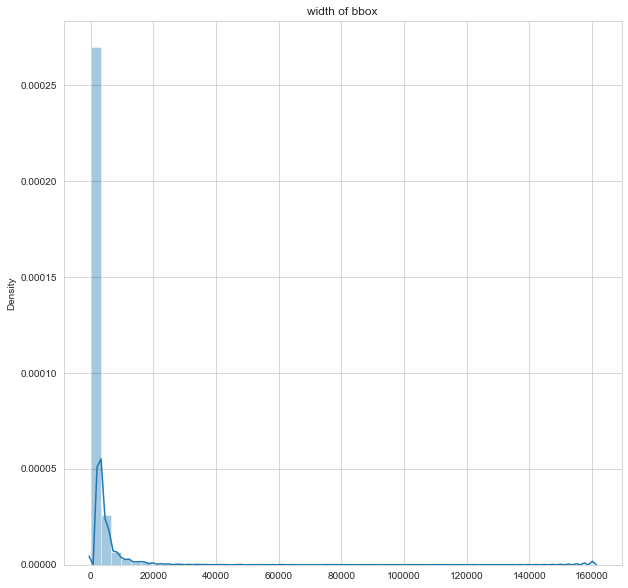

In [ ]:
#bbox width distibution
sns.set_style("whitegrid")
plt.figure(figsize=(10,10))
sns.distplot(bbox_size)
plt.title("width of bbox")
plt.ylabel("Density")
plt.show()

1. Most to the bounding box  are having size as 5000.
2. Few are having width more than 15000.
3. Almost all bounding boxes are having the same size.